#### Required installations and content import

In [ ]:
! sudo apt install -y fluidsynth

In [ ]:
! pip install mido hmmlearn music21 boruta h2o pyfluidsynth pretty_midi

In [ ]:
import pandas as pd
import mido
import string
import numpy as np
import matplotlib.pyplot as plt
import csv
import re
import collections
import datetime
import fluidsynth
import music21
import glob
import h2o
import pretty_midi
import tensorflow as tf

from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from IPython import display
from typing import Optional
from google.colab import drive
from sklearn.preprocessing import StandardScaler
from hmmlearn import hmm
from music21 import converter, features
from boruta import BorutaPy
from sklearn.ensemble import RandomForestClassifier
from h2o.automl import H2OAutoML
from keras import models, layers

drive.mount('/content/drive')
path = '/content/drive/MyDrive/maestro-v3.0.0'

data = pd.read_csv(f'{path}/maestro-v3.0.0.csv')
key_order = ['pitch', 'step', 'duration']

data.head()

Mounted at /content/drive


,canonical_composer,canonical_title,split,year,midi_filename,audio_filename,duration
0,Alban Berg,Sonata Op. 1,train,2018,2018/MIDI-Unprocessed_Chamber3_MID--AUDIO_10_R...,2018/MIDI-Unprocessed_Chamber3_MID--AUDIO_10_R...,698.661160
1,Alban Berg,Sonata Op. 1,train,2008,2008/MIDI-Unprocessed_03_R2_2008_01-03_ORIG_MI...,2008/MIDI-Unprocessed_03_R2_2008_01-03_ORIG_MI...,759.518471
2,Alban Berg,Sonata Op. 1,train,2017,2017/MIDI-Unprocessed_066_PIANO066_MID--AUDIO-...,2017/MIDI-Unprocessed_066_PIANO066_MID--AUDIO-...,464.649433
3,Alexander Scriabin,"24 Preludes Op. 11, No. 13-24",train,2004,2004/MIDI-Unprocessed_XP_21_R1_2004_01_ORIG_MI...,2004/MIDI-Unprocessed_XP_21_R1_2004_01_ORIG_MI...,872.640588
4,Alexander Scriabin,"3 Etudes, Op. 65",validation,2006,2006/MIDI-Unprocessed_17_R1_2006_01-06_ORIG_MI...,2006/MIDI-Unprocessed_17_R1_2006_01-06_ORIG_MI...,397.857508


#### Helper Functions

Feature extraction using the music21 library--  this extracts all features that music21 is capable of.

In [2]:
def extract_features(row, path='/content/drive/MyDrive/maestro-v3.0.0'):
    song_path = f'{path}/{row["midi_filename"]}'
    s = converter.parse(song_path)
    f = features.allFeaturesAsList(s)

    feature_dict = dict(zip([x.id for x in features.extractorsById('all')], f))

    final_feature_dict = {}

    for key, value in feature_dict.items():
        if len(value) == 1:
            class_name = re.sub(r'[^a-zA-Z0-9. -]', '', str(features.extractorsById(key)[0]).split(".")[3])
            class_name = class_name.replace('Feature', '')

            if 'Instruments' not in class_name and 'Fraction' not in class_name:
                final_feature_dict[class_name] = float(value[0])

    return pd.Series(final_feature_dict)

def process_data(row, path='/content/drive/MyDrive/maestro-v3.0.0'):
    final_feature_dict = extract_features(row, path)
    return pd.concat([row, final_feature_dict])

MIDI Conversions -- to convert midi to readable files and back. From [Tensorflow Music Generation w/ RNN Tutorial](https://www.tensorflow.org/tutorials/audio/music_generation)

In [ ]:
def midi_to_notes(midi_file: str) -> pd.DataFrame:
  pm = pretty_midi.PrettyMIDI(midi_file)
  instrument = pm.instruments[0]
  notes = collections.defaultdict(list)

  sorted_notes = sorted(instrument.notes, key=lambda note: note.start)
  prev_start = sorted_notes[0].start

  for note in sorted_notes:
    start = note.start
    end = note.end
    notes['pitch'].append(note.pitch)
    notes['start'].append(start)
    notes['end'].append(end)
    notes['step'].append(start - prev_start)
    notes['duration'].append(end - start)
    prev_start = start

  return pd.DataFrame({name: np.array(value) for name, value in notes.items()})

def notes_to_midi(
  notes: pd.DataFrame,
  out_file: str,
  instrument_name: str,
  velocity: int = 100,
) -> pretty_midi.PrettyMIDI:

  pm = pretty_midi.PrettyMIDI()
  instrument = pretty_midi.Instrument(
      program=pretty_midi.instrument_name_to_program(
          instrument_name))

  prev_start = 0
  for i, note in notes.iterrows():
    start = float(prev_start + note['step'])
    end = float(start + note['duration'])
    note = pretty_midi.Note(
        velocity=velocity,
        pitch=int(note['pitch']),
        start=start,
        end=end,
    )
    instrument.notes.append(note)
    prev_start = start

  pm.instruments.append(instrument)
  pm.write(out_file)
  return pm

def display_audio(pm: pretty_midi.PrettyMIDI, seconds=30, _SAMPLING_RATE = 16000):
  waveform = pm.fluidsynth(fs=_SAMPLING_RATE)
  waveform_short = waveform[:seconds*_SAMPLING_RATE]
  return display.Audio(waveform_short, rate=_SAMPLING_RATE)

LSTM functions -- sequence creator, training function, and prediction function. Adapted from [Tensorflow Music Generation w/ RNN Tutorial](https://www.tensorflow.org/tutorials/audio/music_generation). Much of the training methods used below are developed there and tailored to suit the application -- I added the functions to split by composer and generate multiple iterations on the same model, as well as added some randomness to model generation.

In [ ]:
def create_sequences(df, length, vocab_size):

  length = length+1

  windows = df.window(length, shift=1, stride=1,
                              drop_remainder=True)

  flatten = lambda x: x.batch(length, drop_remainder=True)
  sequences = windows.flat_map(flatten)

  def scale_pitch(x):
    x = x/[vocab_size,1.0,1.0]
    return x

  def split_labels(sequences):
    inputs = sequences[:-1]
    labels_dense = sequences[-1]
    labels = {key:labels_dense[i] for i,key in enumerate(key_order)}

    return scale_pitch(inputs), labels

  return sequences.map(split_labels)

def mse_with_positive_pressure(y_true, y_pred):
  mse = (y_true - y_pred) ** 2
  positive_pressure = 10 * tf.maximum(-y_pred, 0.0)
  return tf.reduce_mean(mse + positive_pressure)

def predict_next_note(notes, model, temperature = 1.0):

  assert temperature > 0

  inputs = tf.expand_dims(notes, 0)

  predictions = model.predict(inputs, verbose = 0)
  pitch_logits = predictions['pitch']
  step = predictions['step']
  duration = predictions['duration']

  pitch_logits /= temperature
  pitch = tf.random.categorical(pitch_logits, num_samples=1)
  pitch = tf.squeeze(pitch, axis=-1)
  duration = tf.squeeze(duration, axis=-1)
  step = tf.squeeze(step, axis=-1)

  step = tf.maximum(0, step)
  duration = tf.maximum(0, duration)

  return int(pitch), float(step), float(duration)

def LSTM_train_by_composer(data, label):

  file = data.loc[data['canonical_composer'] == label, 'midi_filename']
  all_notes = []

  for f in file:
    notes = midi_to_notes(f'{path}/{f}')
    all_notes.append(notes)

  all_notes = pd.concat(all_notes)

  n_notes = len(all_notes)

  key_order = ['pitch', 'step', 'duration']
  train_notes = np.stack([all_notes[key] for key in key_order], axis=1)

  notes_ds = tf.data.Dataset.from_tensor_slices(train_notes)
  notes_ds.element_spec

  seq_length = 50
  vocab_size = 128
  seq_ds = create_sequences(notes_ds, seq_length, vocab_size)
  seq_ds.element_spec

  batch_size = 64
  buffer_size = n_notes - seq_length
  train_ds = (seq_ds
              .shuffle(buffer_size)
              .batch(batch_size, drop_remainder=True))

  input_shape = (seq_length, 3)
  learning_rate = 0.005

  inputs = layers.Input(input_shape)
  x = layers.LSTM(128)(inputs)

  outputs = {
    'pitch': layers.Dense(128, name='pitch')(x),
    'step': layers.Dense(1, name='step')(x),
    'duration': layers.Dense(1, name='duration')(x),
  }

  model = models.Model(inputs, outputs)

  loss = {
        'pitch': tf.keras.losses.SparseCategoricalCrossentropy(
            from_logits=True),
        'step': mse_with_positive_pressure,
        'duration': mse_with_positive_pressure,
  }

  optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)

  model.compile(
    loss=loss,
    loss_weights={
        'pitch': 0.05,
        'step': 1.0,
        'duration':1.0,
    },
    optimizer=optimizer,
  )

  callbacks = tf.keras.callbacks.EarlyStopping(
        monitor='loss',
        patience=8,
        verbose=1,
        restore_best_weights=True)

  epochs = 50

  history = model.fit(
      train_ds,
      epochs=epochs,
      callbacks=callbacks,
  )

  return all_notes, model

def generate_midi(num_outputs, notes_array, model, model_name):
  for i in range(num_outputs):
    sample_notes = np.stack([notes_array[key] for key in key_order], axis=1)

    temperature = np.random.randint(1,5)
    num_predictions = np.random.randint(90,150)

    seq_length = 50
    vocab_size = 128

    input_notes = (
        sample_notes[:seq_length] / np.array([vocab_size, 1, 1]))

    generated_notes = []
    prev_start = 0
    for _ in range(num_predictions):
      pitch, step, duration = predict_next_note(input_notes, model, temperature)
      start = prev_start + step
      end = start + duration
      input_note = (pitch, step, duration)
      generated_notes.append((*input_note, start, end))
      input_notes = np.delete(input_notes, 0, axis=0)
      input_notes = np.append(input_notes, np.expand_dims(input_note, 0), axis=0)
      prev_start = start

    generated_notes = pd.DataFrame(
        generated_notes, columns=(*key_order, 'start', 'end'))

    out_file = f'{model_name}_output_{i}.mid'
    out_path = f'{path}/{model_name}/{out_file}'
    out_pm = notes_to_midi(
        generated_notes, out_file=out_path, instrument_name='Acoustic Grand Piano')

  if num_outputs == 1:
    return out_pm

Markov Chain Functions - get transition probabilities, generate music

In [ ]:
def get_transition_probs(notes_df):
  notes_df['previous_pitch'] = notes_df['pitch'].shift()
  notes_df = notes_df.sort_values(by=['pitch', 'duration'])
  transition_probabilities = notes_df.groupby(['previous_pitch', 'pitch', 'step','duration']).size().reset_index(name='count')
  total_occurrences = notes_df.groupby('previous_pitch').size().reset_index(name='total')
  transition_probabilities = pd.merge(transition_probabilities, total_occurrences, on='previous_pitch')
  transition_probabilities['probability'] = transition_probabilities['count'] / transition_probabilities['total']
  transition_probabilities = transition_probabilities.drop(columns=['count', 'total'])

  return transition_probabilities

def generate_markov_music(transition_probabilities, output_path, num_outputs, initial_pitch=None,):
    for i in range(num_outputs):
      generated_music = []

      if initial_pitch is None:
          initial_pitch = np.random.choice(transition_probabilities['previous_pitch'])

      length = np.random.randint(90,120)
      tempo = np.random.randint(90,120)
      current_pitch = initial_pitch
      current_time = 0

      for _ in range(length):
          subset = transition_probabilities[transition_probabilities['previous_pitch'] == current_pitch]

          if subset.empty:
              current_pitch = np.random.choice(transition_probabilities['previous_pitch'])
          else:
            next_pitch = np.random.choice(subset['pitch'], p=subset['probability'])

            next_step = np.random.choice(subset['step'], p=subset['probability'])
            next_duration = np.random.choice(subset['duration'], p=subset['probability'])

            generated_music.append({
                'pitch': next_pitch,
                'step': next_step,
                'duration': next_duration,
                'start': current_time,
                'end': current_time + next_duration
            })

            current_pitch = next_pitch
            current_step = next_step
            current_time += next_duration

      generated_df = pd.DataFrame(generated_music, columns =(*key_order, 'start', 'end'))

      output_filename = f'output_{i}.mid'
      out_pm = notes_to_midi(generated_df, out_file = f'{output_path}/{output_filename}', instrument_name = 'Acoustic Grand Piano')

Another function for splitting the dataset-- wanted to find divisors to make it evenly-sized data chunks.


In [ ]:
def find_divisors(number):
    divisors = [1]
    for i in range(2, int(number**0.5) + 1):
        if number % i == 0:
            divisors.append(i)
            if i != number // i:
                divisors.append(number // i)
    divisors.append(number)
    return divisors

#### Data Processing and Feature Selection

Split the MAESTRO dataset into 11 chunks-- each chunk takes anywhere from 2.5 to 6 hours to fully process depending on MIDI length, so checkpointing was necessary. This block takes roughly 3 days to run, not sped up by GPU.

In [ ]:
num_chunks = 11
chunk_size = len(data) // num_chunks
data_chunks = [data.iloc[i:i+chunk_size] for i in range(0, len(data), chunk_size)]

for i, chunk in enumerate(data_chunks):
  processed_chunk = chunk.apply(lambda row: process_data(row), axis=1)

  csv_filename = f'processed_data_{i}.csv'
  processed_chunk.to_csv(f'{path}/{csv_filename}')

  print(f'Chunk {i}/{num_chunks} processed and saved as {csv_filename}')

file_pattern = 'processed_data_*.csv'
file_list = glob.glob(f'{path}/{file_pattern}')
processed_data = pd.concat([pd.read_csv(file) for file in file_list])
processed_data.to_csv(f'{path}/processed_data.csv')

Remove constant columns, as well as informational columns and durations (wanted classifier to be song-length agnostic as generated songs were only to be 30s in length max).

In [ ]:
processed_data = processed_data.drop(['Unnamed: 0', 'midi_filename', 'year', 'audio_filename', 'canonical_title', 'duration', 'Duration'], axis=1)

std_values = processed_data.std()
zero_std_columns = std_values[std_values == 0].index
processed_data = processed_data.drop(zero_std_columns, axis=1)

Scale the data and perform a Boruta analysis

In [ ]:
scaler = StandardScaler()

target = processed_data['canonical_composer']
split = processed_data['split']
processed_data = processed_data.drop(['canonical_composer', 'split'], axis=1)

In [ ]:
X = data_scaled
y = target

rf_classifier = RandomForestClassifier(n_estimators = 'auto', random_state = 42)

boruta = BorutaPy(estimator = rf_classifier, random_state = 42)
boruta.fit(X.values, y.values)

feature_ranks = pd.DataFrame({'Feature': X.columns, 'Rank': boruta.ranking_})
print(feature_ranks.sort_values(by='Rank'))

important_features = X.columns[boruta.support_].tolist()

for i in important_features:
  print(i)

data_scaled = data_scaled[important_features]

In [ ]:
total_data = pd.concat([data_scaled, target], axis=1)

total_data.to_csv(f'{path}/total_data.csv')

Note that regular checkpoints are being made to be able to resume study on different days.

In [ ]:
total_data = pd.read_csv(f'{path}/total_data.csv')

total_data.drop(['Unnamed: 0'], axis=1, inplace=True)

total_data

,AverageMelodicInterval,MostCommonMelodicInterval,DistanceBetweenMostCommonMelodicIntervals,MostCommonMelodicIntervalPrevalence,RelativeStrengthOfMostCommonIntervals,NumberOfCommonMelodicIntervals,AmountOfArpeggiation,RepeatedNotes,ChromaticMotion,StepwiseMotion,...,MostCommonPitchClassSetSimultaneityPrevalence,MostCommonSetClassSimultaneityPrevalence,MajorTriadSimultaneityPrevalence,MinorTriadSimultaneityPrevalence,DominantSeventhSimultaneityPrevalence,DiminishedTriadSimultaneityPrevalence,TriadSimultaneityPrevalence,DiminishedSeventhSimultaneityPrevalence,IncorrectlySpelledTriadPrevalence,canonical_composer
0,0.395247,0.270465,-0.277013,-0.892924,0.588927,-1.497109,-0.746380,-1.137700,0.258494,-0.689499,...,-0.488576,0.630792,0.183305,-0.536436,-0.156659,-0.243181,-0.059547,-0.289410,-0.674545,Alban Berg
1,0.320735,0.270465,-0.277013,-1.097020,0.883721,-1.497109,-0.090629,-0.603714,0.116074,-0.710835,...,-0.530280,0.395263,-0.286179,-0.403322,-0.288336,0.363626,0.063610,-0.434477,-0.599226,Alban Berg
2,0.446620,-0.501601,-0.277013,-0.963821,-0.204477,-1.497109,-1.045269,-0.768992,0.428652,-0.354686,...,-0.386696,0.508606,-0.300473,-0.348473,-0.207219,-0.655357,-0.218599,-0.123889,-0.451661,Alban Berg
3,0.179998,1.042531,0.229027,-1.156773,1.144281,-1.497109,-0.118159,-0.675578,-0.593533,-0.531376,...,-0.105087,0.680249,-0.428091,-0.356910,-0.472254,-0.540262,-0.244084,-0.440388,0.740511,Alexander Scriabin
4,1.418416,1.814597,-0.023993,-0.095558,-0.845710,-0.611886,0.896632,-0.439204,-0.850987,-1.914578,...,-0.078030,0.514704,-0.993930,-1.270842,-0.716964,-0.927828,-1.158833,-0.715012,-2.027748,Alexander Scriabin
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1271,-0.770978,-0.758956,-0.277013,0.519761,-1.320977,-0.611886,0.946419,1.059189,0.279248,-0.503134,...,0.416435,0.893370,-0.289268,0.254761,0.242204,1.407071,-0.362186,0.228955,2.090115,Wolfgang Amadeus Mozart
1272,-0.276427,-0.758956,-0.277013,0.760962,-0.378930,2.043782,1.850851,1.275482,0.031124,0.047390,...,0.667833,0.017944,1.976449,1.346893,0.516941,0.693575,0.585096,-0.715012,-1.122353,Wolfgang Amadeus Mozart
1273,-0.798366,-0.244245,-0.783054,-0.243747,1.176678,1.158560,-0.238241,-0.651627,1.069052,1.131574,...,0.244304,0.543986,0.644252,0.350445,0.710911,0.676370,-0.175552,0.638038,-0.008244,Wolfgang Amadeus Mozart
1274,-0.701524,-0.244245,-0.783054,-0.268927,1.006433,1.158560,-0.250314,-0.706192,0.840536,0.983844,...,0.166892,0.498353,0.567870,0.347424,0.227168,0.741885,-0.094204,0.187190,-0.068844,Wolfgang Amadeus Mozart


Dropping all but the top 4 composer labels to assist the classifier. These top 4 comprise nearly half of the dataset.

In [ ]:
label_column = 'canonical_composer'

top_labels = total_data[label_column].value_counts().nlargest(4).index

reduced_data = total_data[total_data[label_column].isin(top_labels)]

len(reduced_data)

678

In [ ]:
reduced_data.reset_index(drop=True, inplace=True)

reduced_data

,AverageMelodicInterval,MostCommonMelodicInterval,DistanceBetweenMostCommonMelodicIntervals,MostCommonMelodicIntervalPrevalence,RelativeStrengthOfMostCommonIntervals,NumberOfCommonMelodicIntervals,AmountOfArpeggiation,RepeatedNotes,ChromaticMotion,StepwiseMotion,...,MostCommonPitchClassSetSimultaneityPrevalence,MostCommonSetClassSimultaneityPrevalence,MajorTriadSimultaneityPrevalence,MinorTriadSimultaneityPrevalence,DominantSeventhSimultaneityPrevalence,DiminishedTriadSimultaneityPrevalence,TriadSimultaneityPrevalence,DiminishedSeventhSimultaneityPrevalence,IncorrectlySpelledTriadPrevalence,canonical_composer
0,0.746649,1.042531,0.229027,-0.997715,0.484613,-1.497109,0.286563,-0.618977,-1.490479,-1.662887,...,1.402048,0.777805,1.891699,0.834074,0.465223,0.279841,1.431325,-0.343724,-0.952585,Franz Schubert
1,1.356395,-0.758956,2.000168,0.207413,0.905680,0.273337,0.321418,0.779096,-0.799370,-0.891899,...,1.616683,0.777066,0.647266,1.237488,1.904016,0.890856,1.259241,3.029391,-0.388648,Franz Schubert
2,-0.994715,-0.758956,0.735067,-0.397871,0.932167,0.273337,1.169286,0.236319,0.576400,-0.098569,...,0.752926,-0.147603,0.673210,1.188265,-0.430761,-0.687500,0.728005,-0.027264,-0.575690,Franz Schubert
3,-0.018392,-0.758956,-0.783054,0.212389,-0.797618,0.273337,0.378647,0.783559,0.705105,-0.264352,...,0.089905,0.144911,0.406016,0.486929,0.490444,1.311211,0.954913,1.305341,0.261463,Franz Schubert
4,-0.731269,2.329307,0.229027,-0.590183,0.788961,0.273337,1.567767,-0.179471,-1.315756,-1.183690,...,0.383983,0.782278,0.445667,0.045330,0.460575,-0.377072,0.756689,-0.238497,0.258069,Franz Schubert
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
673,-0.794439,0.013110,-0.783054,-0.344958,0.850356,0.273337,-0.161042,-0.687527,0.189512,0.450413,...,-0.216994,0.303841,0.104376,1.480943,-0.040305,0.996908,0.119663,0.679779,-0.192562,Johann Sebastian Bach
674,-1.240405,-0.244245,-0.783054,0.594204,-1.205579,0.273337,-0.282670,-0.737418,0.754487,1.619205,...,0.748307,0.961058,0.700100,1.788794,-0.082788,0.034904,-0.241777,-0.549933,-0.453741,Johann Sebastian Bach
675,-1.685870,-0.244245,-0.783054,0.940293,-0.760235,1.158560,-0.422945,-0.597594,1.441681,2.277550,...,0.593522,0.825014,0.557698,1.787276,-0.205104,0.488169,-0.234292,-0.258324,-0.292694,Johann Sebastian Bach
676,-1.498893,-0.244245,-0.783054,0.215526,-0.029027,1.158560,0.376863,-0.278252,1.245517,1.593936,...,0.729177,0.794219,0.325166,1.275829,-0.580863,-0.353820,0.102462,-0.489410,-0.076916,Johann Sebastian Bach


Removing any features that have more than 0.5 covariance with each other.

In [ ]:
features = reduced_data.drop('canonical_composer', axis = 1)

covariance_matrix = features.cov()

theshold = 0.75
highly_covariant_features = set()
for i in range(len(covariance_matrix.columns)):
  for j in range(i):
    if abs(covariance_matrix.iloc[i, j]) > theshold:
      colname = covariance_matrix.columns[i]
      highly_covariant_features.add(colname)

highly_covariant_features

{'AverageNumberOfIndependentVoices',
 'AverageTimeBetweenAttacks',
 'AverageTimeBetweenAttacksForEachVoice',
 'AverageVariabilityOfTimeBetweenAttacksForEachVoice',
 'MajorTriadSimultaneityPrevalence',
 'MaximumNoteDuration',
 'MinorTriadSimultaneityPrevalence',
 'MostCommonNoteQuarterLengthPrevalence',
 'MostCommonPitchClassSetSimultaneityPrevalence',
 'MostCommonSetClassSimultaneityPrevalence',
 'Range',
 'RangeOfNoteQuarterLengths',
 'RelativeStrengthOfMostCommonIntervals',
 'RepeatedNotes',
 'StepwiseMotion',
 'TriadSimultaneityPrevalence',
 'UniqueSetClassSimultaneities',
 'VariabilityOfNoteDuration',
 'VariabilityOfNumberOfIndependentVoices',
 'VariabilityOfTimeBetweenAttacks'}

Down to 39 features!

In [ ]:
filtered_data = reduced_data.drop(highly_covariant_features, axis=1)
filtered_data.shape

(678, 39)

In [ ]:
filtered_data.to_csv(f'{path}/filtered_data.csv', index=False)

Doing some data visualization to see if there is decent separation between classes-- ran a PCA in 2D and 3D. Honestly, the 3rd dimension doesn't seem to add too much.

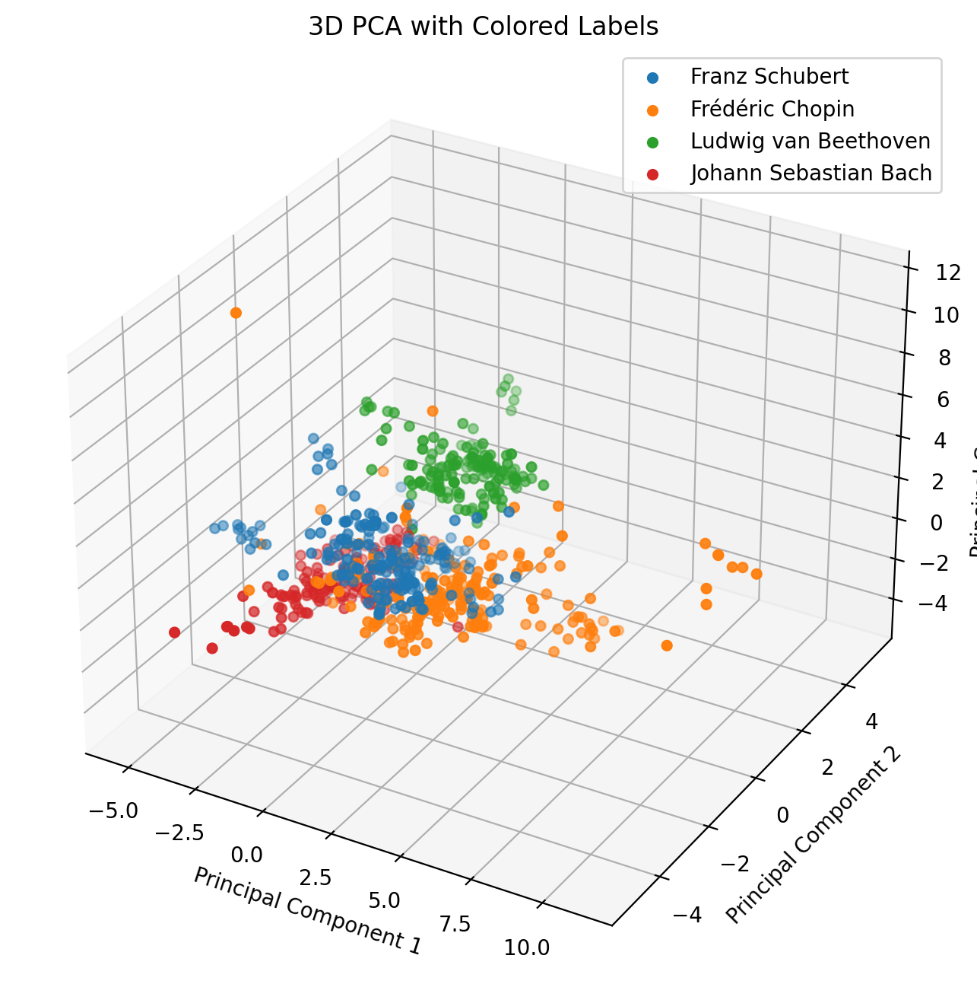

In [ ]:
features = filtered_data.drop('canonical_composer', axis=1)
labels = filtered_data['canonical_composer']

pca = PCA(n_components=3)
principal_components = pca.fit_transform(features)
principal_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2', 'PC3'])

final_df = pd.concat([principal_df, filtered_data['canonical_composer']], axis=1)

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

for label in final_df['canonical_composer'].unique():
    subset = final_df[final_df['canonical_composer'] == label]
    ax.scatter(subset['PC1'], subset['PC2'], subset['PC3'], label=label)

ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
ax.set_title('3D PCA with Colored Labels')
ax.legend()

plt.show()

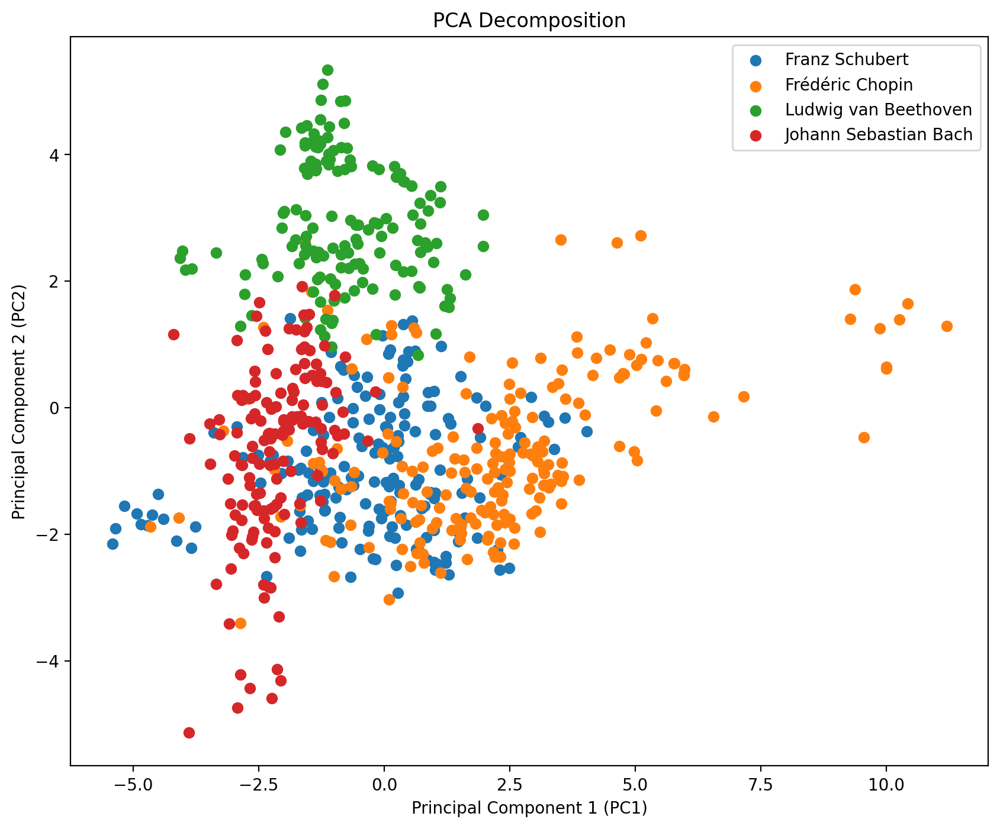

In [ ]:
pca = PCA(n_components=2)  # Specify the number of components to keep
principal_components_2D = pca.fit_transform(features)

# Create a DataFrame with the principal components
pc_df = pd.DataFrame(data=principal_components_2D, columns=['PC1', 'PC2'])

# Concatenate the principal components with the original DataFrame
result_df = pd.concat([labels, pc_df], axis=1)

# Plot the results
plt.figure(figsize=(10,8))

for label in labels.unique():
    label_data = result_df[result_df['canonical_composer'] == label]
    plt.scatter(label_data['PC1'], label_data['PC2'], label=label)

plt.legend()
plt.title('PCA Decomposition')
plt.xlabel('Principal Component 1 (PC1)')
plt.ylabel('Principal Component 2 (PC2)')

# Display the plot
plt.show()

Tried a K-Means as well to see how a clustering algorithm would fare-- Cluster 3 captures Beethoven quite well, and Cluster 2 is a decent representation for Bach, but Schubert and Chopin seem to be too similar to properly split.

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


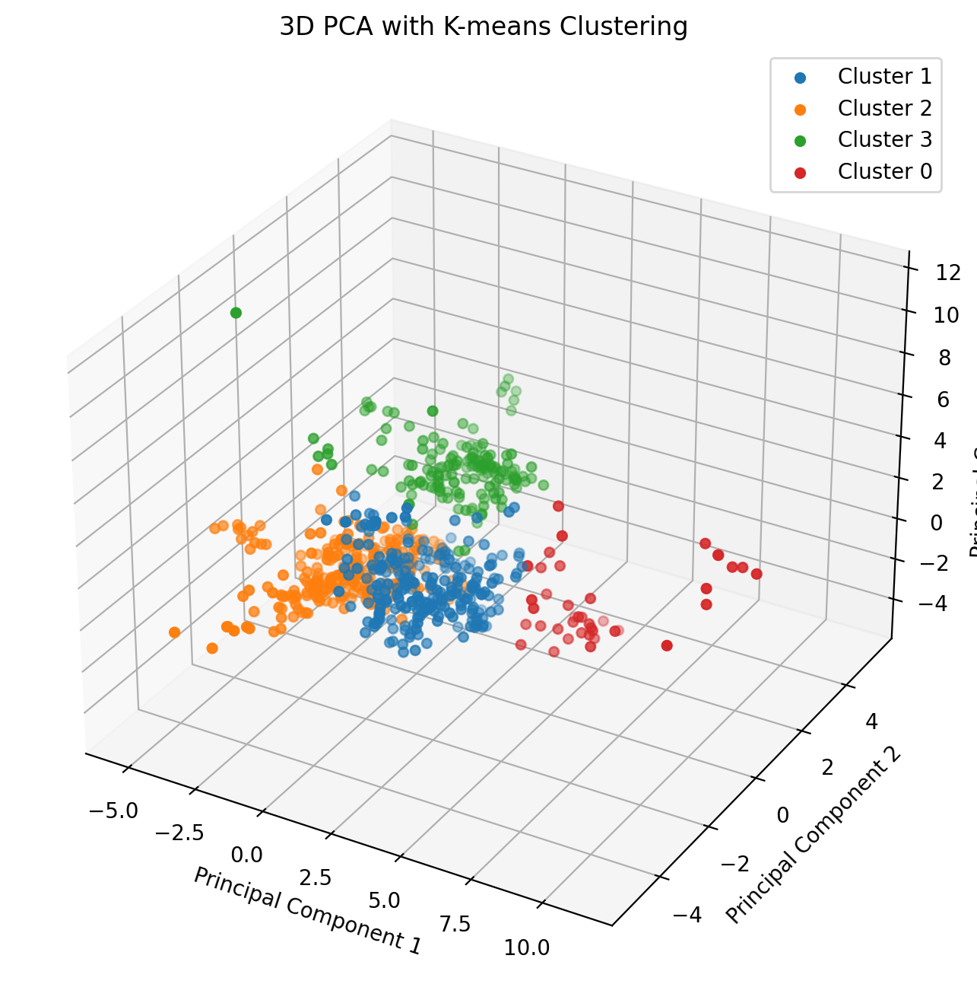

In [ ]:
from sklearn.cluster import KMeans
import seaborn as sns

kmeans = KMeans(n_clusters=4)  # Adjust the number of clusters as needed
final_df['Cluster'] = kmeans.fit_predict(principal_df)

# Step 5: Plot 3D scatter plot with colored clusters
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Loop through unique clusters and plot them separately
for cluster in final_df['Cluster'].unique():
    subset = final_df[final_df['Cluster'] == cluster]
    ax.scatter(subset['PC1'], subset['PC2'], subset['PC3'], label=f'Cluster {cluster}')

ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
ax.set_title('3D PCA with K-means Clustering')
ax.legend()

plt.show()

Runnning the actual classifier with 80% of the data to train and a 20% holdout.

In [ ]:
h2o.init()

train = h2o.import_file(f'{path}/filtered_data.csv')
train_set, test_set = train.split_frame(ratios=[0.8], seed=42)

x = train_set.columns
y = 'canonical_composer'
x.remove(y)

train[y] = train[y].asfactor()

Checking whether there is an H2O instance running at http://localhost:54321. connected.


H2O_cluster_uptime:,3 mins 18 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.44.0.2
H2O_cluster_version_age:,1 month and 6 days
H2O_cluster_name:,H2O_from_python_unknownUser_1bieqj
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.166 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [ ]:
aml = H2OAutoML(max_models = 30)
aml.train(x=x, y=y, training_frame=train_set)

AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%


key,value
Stacking strategy,cross_validation
Number of base models (used / total),10/30
# GBM base models (used / total),3/10
# XGBoost base models (used / total),0/10
# DRF base models (used / total),2/2
# DeepLearning base models (used / total),5/7
# GLM base models (used / total),0/1
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5


The classifier worked surprisingly well on the training data. Checking with the test set...

In [ ]:
predictions = aml.predict(test_set)

predictions_df = predictions['predict'].as_data_frame()
actual_values_df = test_set[y].as_data_frame()

result = pd.concat([predictions_df, actual_values_df], axis=1)

confusion_matrix = pd.crosstab(result['predict'], result[y], rownames=['Predicted'], colnames=['Actual'])
print("Confusion Matrix:\n", confusion_matrix)

stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%
Confusion Matrix:
 Actual                 Franz Schubert  Frédéric Chopin  Johann Sebastian Bach  \
Predicted                                                                       
Franz Schubert                     34                1                      0   
Frédéric Chopin                     0               45                      0   
Johann Sebastian Bach               0                1                     23   
Ludwig van Beethoven                0                0                      0   

Actual                 Ludwig van Beethoven  
Predicted                                    
Franz Schubert                            0  
Frédéric Chopin                           0  
Johann Sebastian Bach                     0  
Ludwig van Beethoven                     36  


In [ ]:
leader_model = aml.leader
leader_model.model_performance(test_set)

ModelMetricsMultinomialGLM: stackedensemble
** Reported on test data. **

MSE: 0.018432464236992546
RMSE: 0.1357662116912472
LogLoss: 0.07483795390876641
Null degrees of freedom: 139
Residual degrees of freedom: 117
Null deviance: 386.08342240608795
Residual deviance: 20.954627094454597
AUC table was not computed: it is either disabled (model parameter 'auc_type' was set to AUTO or NONE) or the domain size exceeds the limit (maximum is 50 domains).
AUCPR table was not computed: it is either disabled (model parameter 'auc_type' was set to AUTO or NONE) or the domain size exceeds the limit (maximum is 50 domains).

Confusion Matrix: Row labels: Actual class; Column labels: Predicted class
Franz Schubert    Frédéric Chopin    Johann Sebastian Bach    Ludwig van Beethoven    Error      Rate
----------------  -----------------  -----------------------  ----------------------  ---------  -------
34                0                  0                        0                       0          0 / 34
1                 45                 1                        0                       0.0425532  2 / 47
0                 0                  23                       0                       0          0 / 23
0                 0                  0                        36                      0          0 / 36
35                45                 24                       36                      0.0142857  2 / 140

Top-4 Hit Ratios: 
k    hit_ratio
---  -----------
1    0.985714
2    1
3    1
4    1

Very good accuracy even on the test set-- this is a strong classifier for this data set. Saving the model...

In [ ]:
h2o.save_model(model=leader_model, path=f'{path}/leader_model.aml', force=True)

'/content/drive/MyDrive/maestro-v3.0.0/leader_model.aml/StackedEnsemble_AllModels_1_AutoML_3_20231215_15726'

#### LSTM Methods

PrettyMIDI sample of a Schubert piece.



In [ ]:
file  = data.loc[data['canonical_composer'] == 'Franz Schubert', 'midi_filename'].iloc[0]
pm = pretty_midi.PrettyMIDI(f'{path}/{file}')

In [ ]:
_SAMPLING_RATE = 16000
display_audio(pm)

Training models by all composers separately-- at the end, 4 different models are generated.

Note that pitch loss is scaled down in the model compliation method above to not let it dominate the entirety of the predicitions.

In [ ]:
chopin_notes, chopAIn = LSTM_train_by_composer(data, 'Frédéric Chopin')

Epoch 1/50
15042/15042 [==============================] - 189s 5ms/step - loss: 0.3229 - duration_loss: 0.0932 - pitch_loss: 3.8579 - step_loss: 0.0368
Epoch 2/50
15042/15042 [==============================] - 72s 5ms/step - loss: 0.3114 - duration_loss: 0.0894 - pitch_loss: 3.7533 - step_loss: 0.0344
Epoch 3/50
15042/15042 [==============================] - 72s 5ms/step - loss: 0.3055 - duration_loss: 0.0871 - pitch_loss: 3.7038 - step_loss: 0.0332
Epoch 4/50
15042/15042 [==============================] - 71s 5ms/step - loss: 0.3006 - duration_loss: 0.0849 - pitch_loss: 3.6687 - step_loss: 0.0323
Epoch 5/50
15042/15042 [==============================] - 71s 5ms/step - loss: 0.2967 - duration_loss: 0.0830 - pitch_loss: 3.6397 - step_loss: 0.0317
Epoch 6/50
15042/15042 [==============================] - 72s 5ms/step - loss: 0.2946 - duration_loss: 0.0820 - pitch_loss: 3.6266 - step_loss: 0.0312
Epoch 7/50
15042/15042 [==============================] - 72s 5ms/step - loss: 0.2954 - durat

In [ ]:
chopAIn.save(f'{path}/models/chopAIn.keras')
chopin_notes.to_csv(f'{path}/models/chopin_notes.csv')

In [ ]:
schubert_notes, schuBot = LSTM_train_by_composer(data, 'Franz Schubert')

Epoch 1/50
18609/18609 [==============================] - 245s 5ms/step - loss: 0.3263 - duration_loss: 0.0830 - pitch_loss: 3.8005 - step_loss: 0.0533
Epoch 2/50
18609/18609 [==============================] - 94s 5ms/step - loss: 0.3055 - duration_loss: 0.0756 - pitch_loss: 3.6072 - step_loss: 0.0496
Epoch 3/50
18609/18609 [==============================] - 94s 5ms/step - loss: 0.2967 - duration_loss: 0.0719 - pitch_loss: 3.5458 - step_loss: 0.0475
Epoch 4/50
18609/18609 [==============================] - 95s 5ms/step - loss: 0.2921 - duration_loss: 0.0698 - pitch_loss: 3.5179 - step_loss: 0.0464
Epoch 5/50
18609/18609 [==============================] - 95s 5ms/step - loss: 0.2895 - duration_loss: 0.0687 - pitch_loss: 3.5026 - step_loss: 0.0457
Epoch 6/50
18609/18609 [==============================] - 94s 5ms/step - loss: 0.2862 - duration_loss: 0.0674 - pitch_loss: 3.4841 - step_loss: 0.0446
Epoch 7/50
18609/18609 [==============================] - 94s 5ms/step - loss: 0.3063 - durat

In [ ]:
schuBot.save(f'{path}/models/schuBot.keras')
schubert_notes.to_csv(f'{path}/models/schubert_notes.csv')

In [ ]:
bach_notes, JSBot = LSTM_train_by_composer(data, 'Johann Sebastian Bach')

Epoch 1/50
5792/5792 [==============================] - 75s 5ms/step - loss: 0.4095 - duration_loss: 0.1881 - pitch_loss: 3.6658 - step_loss: 0.0381
Epoch 2/50
5792/5792 [==============================] - 29s 5ms/step - loss: 0.3945 - duration_loss: 0.1806 - pitch_loss: 3.5577 - step_loss: 0.0359
Epoch 3/50
5792/5792 [==============================] - 29s 5ms/step - loss: 0.3838 - duration_loss: 0.1770 - pitch_loss: 3.4358 - step_loss: 0.0350
Epoch 4/50
5792/5792 [==============================] - 29s 5ms/step - loss: 0.3774 - duration_loss: 0.1738 - pitch_loss: 3.3908 - step_loss: 0.0341
Epoch 5/50
5792/5792 [==============================] - 29s 5ms/step - loss: 0.3729 - duration_loss: 0.1708 - pitch_loss: 3.3740 - step_loss: 0.0334
Epoch 6/50
5792/5792 [==============================] - 29s 5ms/step - loss: 0.3700 - duration_loss: 0.1689 - pitch_loss: 3.3655 - step_loss: 0.0328
Epoch 7/50
5792/5792 [==============================] - 29s 5ms/step - loss: 0.3681 - duration_loss: 0.167

In [ ]:
JSBot.save(f'{path}/models/JSBot.keras')
bach_notes.to_csv(f'{path}/models/bach_notes.csv')

In [ ]:
beet_notes, lstm_von_Bothooven = LSTM_train_by_composer(data, 'Ludwig van Beethoven')

Epoch 1/50
14665/14665 [==============================] - 191s 5ms/step - loss: 0.3390 - duration_loss: 0.1039 - pitch_loss: 3.8578 - step_loss: 0.0422
Epoch 2/50
14665/14665 [==============================] - 74s 5ms/step - loss: 0.3159 - duration_loss: 0.0954 - pitch_loss: 3.6344 - step_loss: 0.0388
Epoch 3/50
14665/14665 [==============================] - 74s 5ms/step - loss: 0.3066 - duration_loss: 0.0918 - pitch_loss: 3.5425 - step_loss: 0.0378
Epoch 4/50
14665/14665 [==============================] - 74s 5ms/step - loss: 0.3026 - duration_loss: 0.0890 - pitch_loss: 3.5250 - step_loss: 0.0374
Epoch 5/50
14665/14665 [==============================] - 74s 5ms/step - loss: 0.2997 - duration_loss: 0.0877 - pitch_loss: 3.5024 - step_loss: 0.0369
Epoch 6/50
14665/14665 [==============================] - 74s 5ms/step - loss: 0.3012 - duration_loss: 0.0880 - pitch_loss: 3.5219 - step_loss: 0.0371
Epoch 7/50
14665/14665 [==============================] - 75s 5ms/step - loss: 0.3005 - durat

In [ ]:
lstm_von_Bothooven.save(f'{path}/models/lstm_von_Bothooven.keras')
beet_notes.to_csv(f'{path}/models/beet_notes.csv')

Generating 100 pieces with each trained model.

In [ ]:
generate_midi(100, beet_notes, lstm_von_Bothooven, 'lstm_von_Bothooven')
generate_midi(100, bach_notes, JSBot, 'JSBot')
generate_midi(100, schubert_notes, schuBot, 'schuBot')
generate_midi(100, chopin_notes, chopAIn, 'chopAIn')

Displaying a random piece from each set. This is playable in the notebook.

In [ ]:
choice = np.random.randint(0,100)

pm = pretty_midi.PrettyMIDI(f'{path}/lstm_von_Bothooven/lstm_von_Bothooven_output_{choice}.mid')
display_audio(pm)

In [ ]:
choice = np.random.randint(0,100)

pm = pretty_midi.PrettyMIDI(f'{path}/chopAIn/chopAIn_output_{choice}.mid')
display_audio(pm)

In [ ]:
choice = np.random.randint(0,100)

pm = pretty_midi.PrettyMIDI(f'{path}/schuBot/schuBot_output_{choice}.mid')
display_audio(pm)

In [ ]:
choice = np.random.randint(0,100)

pm = pretty_midi.PrettyMIDI(f'{path}/JSBot/JSBot_output_{choice}.mid')
display_audio(pm)

Setting up the dataset for the data extraction methods used in the classification step...

In [ ]:
import os

paths = ['/content/drive/MyDrive/maestro-v3.0.0/chopAIn', '/content/drive/MyDrive/maestro-v3.0.0/schuBot', '/content/drive/MyDrive/maestro-v3.0.0/JSBot', '/content/drive/MyDrive/maestro-v3.0.0/lstm_von_Bothooven']

data = []

for pat in paths:
  files = os.listdir(pat)
  data.extend([(pat, file) for file in files])

df = pd.DataFrame(data, columns=['path', 'file'])

df.head()

,path,file
0,/content/drive/MyDrive/maestro-v3.0.0/chopAIn,chopAIn_output_0.mid
1,/content/drive/MyDrive/maestro-v3.0.0/chopAIn,chopAIn_output_1.mid
2,/content/drive/MyDrive/maestro-v3.0.0/chopAIn,chopAIn_output_2.mid
3,/content/drive/MyDrive/maestro-v3.0.0/chopAIn,chopAIn_output_3.mid
4,/content/drive/MyDrive/maestro-v3.0.0/chopAIn,chopAIn_output_4.mid


In [ ]:
path = '/content/drive/MyDrive/maestro-v3.0.0'

def label_df(asd):
  if '/content/drive/MyDrive/maestro-v3.0.0/chopAIn' in asd:
    return 'Frédéric Chopin'
  elif 	'/content/drive/MyDrive/maestro-v3.0.0/schuBot' in asd:
    return 'Franz Schubert'
  elif 	'/content/drive/MyDrive/maestro-v3.0.0/JSBot' in asd:
    return 'Johann Sebastian Bach'
  else:
    return 'Ludwig van Beethoven'

df['canonical_composer'] = df['path'].apply(label_df)

,path,file,canonical_composer
0,/content/drive/MyDrive/maestro-v3.0.0/chopAIn,chopAIn_output_0.mid,Frédéric Chopin
1,/content/drive/MyDrive/maestro-v3.0.0/chopAIn,chopAIn_output_1.mid,Frédéric Chopin
2,/content/drive/MyDrive/maestro-v3.0.0/chopAIn,chopAIn_output_2.mid,Frédéric Chopin
3,/content/drive/MyDrive/maestro-v3.0.0/chopAIn,chopAIn_output_3.mid,Frédéric Chopin
4,/content/drive/MyDrive/maestro-v3.0.0/chopAIn,chopAIn_output_4.mid,Frédéric Chopin


In [ ]:
df['midi_filename'] = df['path'] + '/' + df['file']

df['midi_filename'] = df.apply(lambda row: '/'.join(row['midi_filename'].split('/')[-2:]), axis=1)

Running the actual processing-- this takes place much quicker than the standard dataset, approx half an hour for the 400 pieces.

In [ ]:
gen_processed = df.apply(lambda row: process_data(row), axis=1)
gen_processed.to_csv(f'{path}/gen_processed.csv')

In [ ]:
generated_pieces = pd.read_csv(f'{path}/gen_processed.csv')

generated_pieces

,Unnamed: 0,path,file,canonical_composer,Full Path,midi_filename,AverageMelodicInterval,MostCommonMelodicInterval,DistanceBetweenMostCommonMelodicIntervals,MostCommonMelodicIntervalPrevalence,...,MostCommonSetClassSimultaneityPrevalence,MajorTriadSimultaneityPrevalence,MinorTriadSimultaneityPrevalence,DominantSeventhSimultaneityPrevalence,DiminishedTriadSimultaneityPrevalence,TriadSimultaneityPrevalence,DiminishedSeventhSimultaneityPrevalence,IncorrectlySpelledTriadPrevalence,LandiniCadence,Language
0,0,/content/drive/MyDrive/maestro-v3.0.0/chopAIn,chopAIn_output_0.mid,Frédéric Chopin,/content/drive/MyDrive/maestro-v3.0.0/chopAIn/...,chopAIn/chopAIn_output_0.mid,1.477477,0.0,4.0,0.864865,...,0.299625,0.007491,0.003745,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0
1,1,/content/drive/MyDrive/maestro-v3.0.0/chopAIn,chopAIn_output_1.mid,Frédéric Chopin,/content/drive/MyDrive/maestro-v3.0.0/chopAIn/...,chopAIn/chopAIn_output_1.mid,2.687500,0.0,12.0,0.785714,...,0.316498,0.003367,0.013468,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0
2,2,/content/drive/MyDrive/maestro-v3.0.0/chopAIn,chopAIn_output_2.mid,Frédéric Chopin,/content/drive/MyDrive/maestro-v3.0.0/chopAIn/...,chopAIn/chopAIn_output_2.mid,1.982301,0.0,15.0,0.876106,...,0.328622,0.000000,0.003534,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0
3,3,/content/drive/MyDrive/maestro-v3.0.0/chopAIn,chopAIn_output_3.mid,Frédéric Chopin,/content/drive/MyDrive/maestro-v3.0.0/chopAIn/...,chopAIn/chopAIn_output_3.mid,1.142857,0.0,2.0,0.873016,...,0.313665,0.012422,0.009317,0.000000,0.000000,0.009317,0.0,0.000000,0.0,0.0
4,4,/content/drive/MyDrive/maestro-v3.0.0/chopAIn,chopAIn_output_4.mid,Frédéric Chopin,/content/drive/MyDrive/maestro-v3.0.0/chopAIn/...,chopAIn/chopAIn_output_4.mid,2.180180,0.0,8.0,0.819820,...,0.328990,0.107492,0.009772,0.000000,0.000000,0.003257,0.0,0.000000,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
395,395,/content/drive/MyDrive/maestro-v3.0.0/lstm_von...,lstm_von_Bothooven_output_95.mid,Ludwig van Beethoven,/content/drive/MyDrive/maestro-v3.0.0/lstm_von...,lstm_von_Bothooven/lstm_von_Bothooven_output_9...,4.047619,0.0,1.0,0.555556,...,0.255973,0.020478,0.010239,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0
396,396,/content/drive/MyDrive/maestro-v3.0.0/lstm_von...,lstm_von_Bothooven_output_96.mid,Ludwig van Beethoven,/content/drive/MyDrive/maestro-v3.0.0/lstm_von...,lstm_von_Bothooven/lstm_von_Bothooven_output_9...,1.735294,0.0,3.0,0.455882,...,0.426415,0.000000,0.132075,0.000000,0.003774,0.007547,0.0,0.000000,0.0,0.0
397,397,/content/drive/MyDrive/maestro-v3.0.0/lstm_von...,lstm_von_Bothooven_output_97.mid,Ludwig van Beethoven,/content/drive/MyDrive/maestro-v3.0.0/lstm_von...,lstm_von_Bothooven/lstm_von_Bothooven_output_9...,1.666667,0.0,3.0,0.719298,...,0.396825,0.115079,0.392857,0.000000,0.000000,0.067460,0.0,0.150000,0.0,0.0
398,398,/content/drive/MyDrive/maestro-v3.0.0/lstm_von...,lstm_von_Bothooven_output_98.mid,Ludwig van Beethoven,/content/drive/MyDrive/maestro-v3.0.0/lstm_von...,lstm_von_Bothooven/lstm_von_Bothooven_output_9...,5.380282,0.0,4.0,0.338028,...,0.263514,0.195946,0.108108,0.003378,0.000000,0.175676,0.0,-0.368421,0.0,0.0


Already did the data selection earlier, so elminating unnecessary columns.

In [ ]:
common_columns = generated_pieces.columns.intersection(filtered_data.columns)

generated_pieces = generated_pieces[common_columns]

Visualizing with a PCA decomposition.

In [ ]:
scaler = StandardScaler()

target = generated_pieces['canonical_composer']
data = generated_pieces.drop('canonical_composer', axis=1)
scaler.fit(data)

scaled_gen = scaler.transform(data)
scaled_gen = pd.DataFrame(scaled_gen, columns=data.columns)

scaled_gen['canonical_composer'] = target

In [ ]:
scaled_gen = pd.read_csv(f'{path}/scaled_gen.csv')
scaled_gen = scaled_gen.drop('Unnamed: 0', axis = 1)
scaled_gen

,AverageMelodicInterval,MostCommonMelodicInterval,DistanceBetweenMostCommonMelodicIntervals,MostCommonMelodicIntervalPrevalence,NumberOfCommonMelodicIntervals,AmountOfArpeggiation,ChromaticMotion,MelodicThirds,MelodicFifths,MelodicTritones,...,ImportanceOfHighRegister,MostCommonPitchClass,TonalCertainty,UniqueNoteQuarterLengths,UniquePitchClassSetSimultaneities,DominantSeventhSimultaneityPrevalence,DiminishedTriadSimultaneityPrevalence,DiminishedSeventhSimultaneityPrevalence,IncorrectlySpelledTriadPrevalence,canonical_composer
0,-0.632131,-0.247216,-0.130229,1.522095,-1.192734,1.324627,-1.066379,-0.895338,-0.585700,-0.158344,...,-0.887484,1.268197,0.327123,0.196716,0.764924,-0.211270,-0.332135,-0.154485,0.033867,Frédéric Chopin
1,-0.383258,-0.247216,1.176140,1.208130,-1.192734,1.068144,-0.961032,-1.213445,-0.585700,-0.708108,...,0.190359,1.268197,0.917973,0.720130,-0.474692,-0.211270,-0.332135,-0.154485,0.033867,Frédéric Chopin
2,-0.528301,-0.247216,1.666028,1.566686,-1.192734,1.376246,-1.066379,-1.318223,-0.585700,-0.438091,...,-2.293444,1.268197,-0.317902,1.243544,0.010375,-0.211270,-0.332135,-0.154485,0.033867,Frédéric Chopin
3,-0.700955,-0.247216,-0.456821,1.554428,-1.192734,1.343423,-0.879097,-1.225087,-0.585700,-0.223792,...,-1.240833,-0.538903,1.808964,0.981837,0.872717,-0.211270,-0.332135,-0.154485,0.033867,Frédéric Chopin
4,-0.487602,-0.247216,0.522956,1.343416,-1.192734,1.236914,-0.853788,-1.106780,-0.214362,-0.708108,...,0.097626,1.268197,1.947859,1.243544,-0.959760,-0.211270,-0.332135,-0.154485,0.033867,Frédéric Chopin
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
395,-0.103513,-0.247216,-0.620117,0.295162,-0.515044,0.184352,0.244595,-0.386870,-0.585700,-0.223792,...,0.362706,-0.538903,-1.411630,-0.762876,0.495442,-0.211270,-0.332135,-0.154485,0.033867,Ludwig van Beethoven
396,-0.579104,-0.247216,-0.293525,-0.100211,0.840335,0.375258,-0.198823,1.442962,-0.585700,-0.708108,...,0.775360,-1.313375,-0.238259,-0.501169,-0.690278,-0.211270,0.031978,-0.154485,0.033867,Ludwig van Beethoven
397,-0.593220,-0.247216,-0.293525,0.944678,-0.515044,1.038404,-0.445391,0.122922,-0.585700,-0.708108,...,0.771210,-1.313375,0.378415,-1.460761,-0.851967,-0.211270,-0.332135,-0.154485,0.104605,Ludwig van Beethoven
398,0.170585,-0.247216,-0.130229,-0.567701,0.162646,-0.318456,-0.734019,0.665164,-0.005158,0.581127,...,0.437220,0.493726,0.816409,-0.501169,0.926614,0.416928,-0.332135,-0.154485,-0.139876,Ludwig van Beethoven


The below was *supposed* to help order the labels in the correct way to match previous values, but PCA reordered anyways.

In [ ]:
order = ['Franz Schubert', 'Frédéric Chopin', 'Ludwig van Beethoven','Johann Sebastian Bach']
scaled_gen['canonical_composer'] = pd.Categorical(scaled_gen['canonical_composer'], categories = order, ordered = True)
scaled_gen = scaled_gen.sort_values(by='canonical_composer')

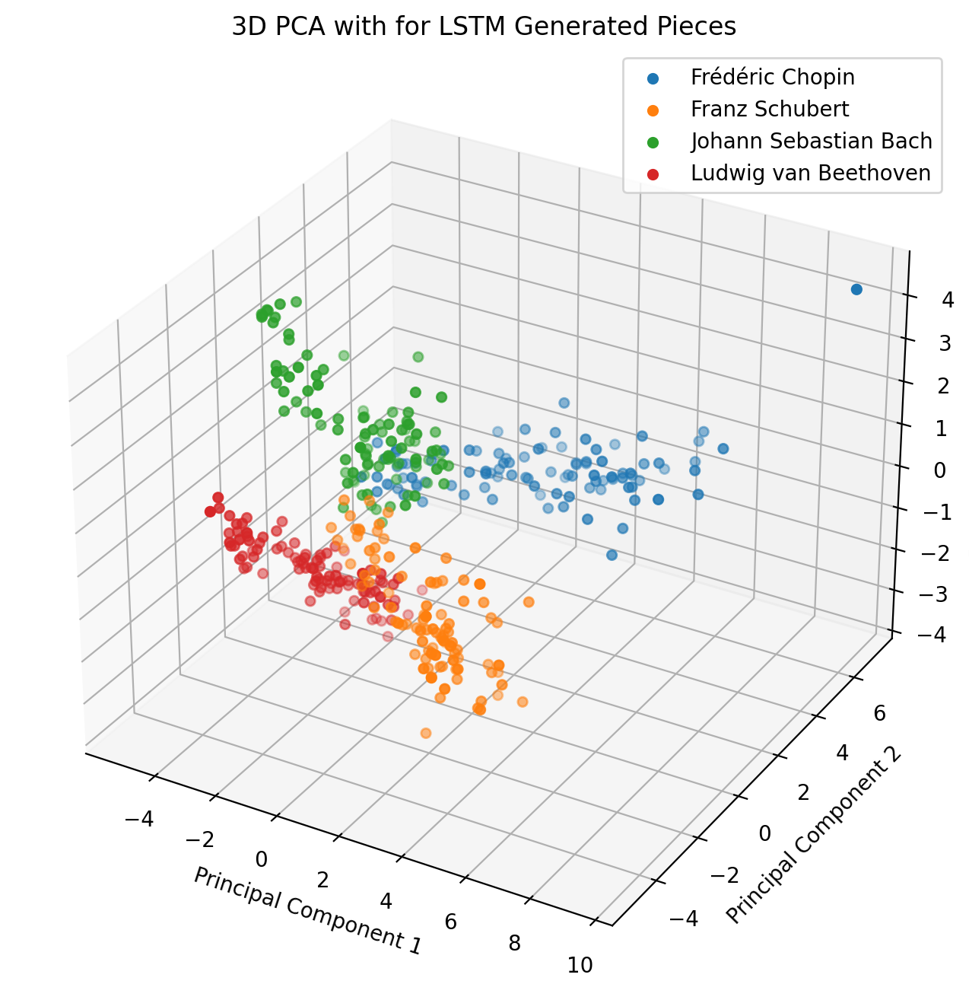

In [ ]:
features = scaled_gen.drop('canonical_composer', axis=1)
labels = scaled_gen['canonical_composer']

pca = PCA(n_components=3)
principal_components = pca.fit_transform(features)
principal_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2', 'PC3'])

final_df = pd.concat([principal_df, scaled_gen['canonical_composer']], axis=1)

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

for label in final_df['canonical_composer'].unique():
    subset = final_df[final_df['canonical_composer'] == label]
    ax.scatter(subset['PC1'], subset['PC2'], subset['PC3'], label=label)

ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
ax.set_title('3D PCA with for LSTM Generated Pieces')
ax.legend()

plt.show()

The groups seem pretty cleanly separable -- clearly the models are generating music with more distinct styles.

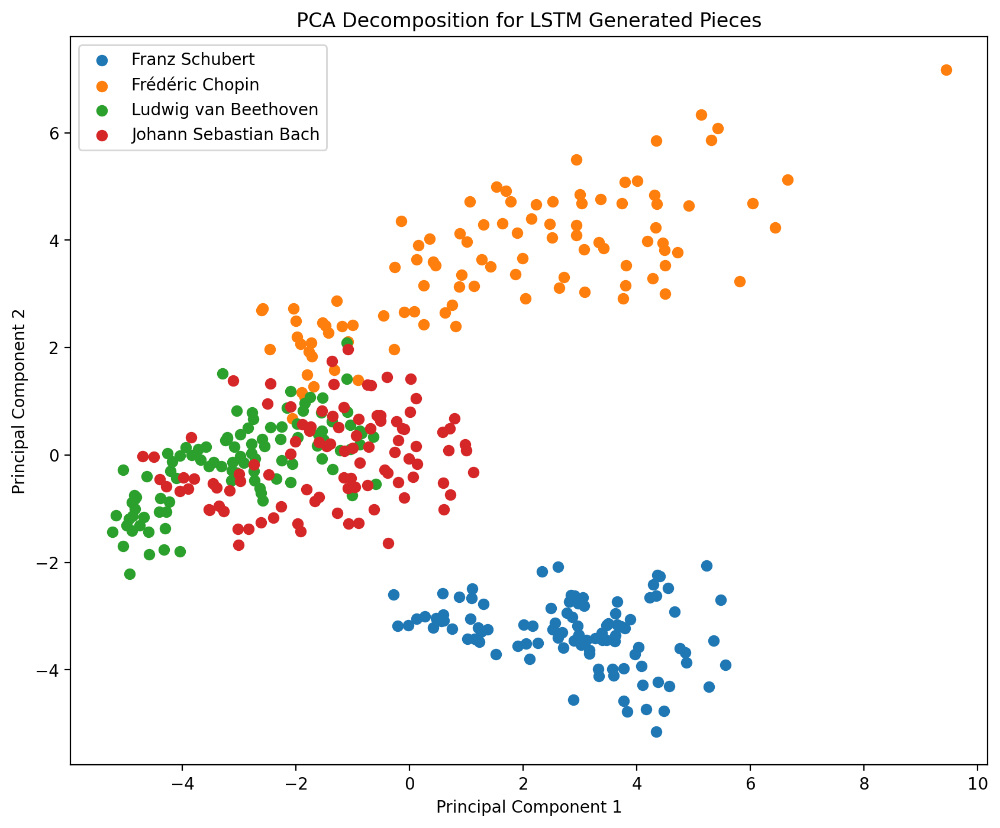

In [ ]:
pca = PCA(n_components=2)
principal_components_2D = pca.fit_transform(features)

pc_df = pd.DataFrame(data=principal_components_2D, columns=['PC1', 'PC2'])

result_df = pd.concat([labels, pc_df], axis=1)

plt.figure(figsize=(10,8))

for label in labels.unique():
    label_data = result_df[result_df['canonical_composer'] == label]
    plt.scatter(label_data['PC1'], label_data['PC2'], label=label)

plt.legend()
plt.title('PCA Decomposition for LSTM Generated Pieces')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')

plt.show()

Same for the 2D. Predicting now with the classifier to see if we've had any success with mimicking styles...

In [ ]:
h2o.init()
leader_model = h2o.load_model('/content/drive/MyDrive/maestro-v3.0.0/leader_model.aml/StackedEnsemble_AllModels_1_AutoML_3_20231215_15726')
scaled_gen.to_csv(f'{path}/scaled_gen.csv')

predict = h2o.import_file(f'{path}/scaled_gen.csv')

x = predict.columns
y = 'canonical_composer'
x.remove(y)

predictions = leader_model.predict(predict)

predictions_df = predictions['predict'].as_data_frame()

actual_values_df = predict[y].as_data_frame()

result_df = pd.concat([predictions_df, actual_values_df], axis=1)

confusion_matrix = pd.crosstab(result_df['predict'], result_df[y], rownames=['Predicted'], colnames=['Actual'])

Checking whether there is an H2O instance running at http://localhost:54321..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.21" 2023-10-17; OpenJDK Runtime Environment (build 11.0.21+9-post-Ubuntu-0ubuntu122.04); OpenJDK 64-Bit Server VM (build 11.0.21+9-post-Ubuntu-0ubuntu122.04, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.10/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmp3b2681st
  JVM stdout: /tmp/tmp3b2681st/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmp3b2681st/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,04 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.44.0.2
H2O_cluster_version_age:,1 month and 8 days
H2O_cluster_name:,H2O_from_python_unknownUser_4924uz
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.170 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%
Confusion Matrix:
 Actual                 Franz Schubert  Frédéric Chopin  Johann Sebastian Bach  \
Predicted                                                                       
Franz Schubert                      4               14                     20   
Frédéric Chopin                    92               86                     47   
Johann Sebastian Bach               4                0                     26   
Ludwig van Beethoven                0                0                      7   

Actual                 Ludwig van Beethoven  
Predicted                                    
Franz Schubert                           47  
Frédéric Chopin                          51  
Johann Sebastian Bach                     0  
Ludwig van Beethoven                      2  


In [ ]:
print("Confusion Matrix:\n", confusion_matrix)

correct_predictions = confusion_matrix.values.diagonal().sum()
total_predictions = confusion_matrix.values.sum()

accuracy = correct_predictions / total_predictions

print(f"Classification Accuracy: {accuracy * 100:.2f}%")

Confusion Matrix:
 Actual                 Franz Schubert  Frédéric Chopin  Johann Sebastian Bach  \
Predicted                                                                       
Franz Schubert                      4               14                     20   
Frédéric Chopin                    92               86                     47   
Johann Sebastian Bach               4                0                     26   
Ludwig van Beethoven                0                0                      7   

Actual                 Ludwig van Beethoven  
Predicted                                    
Franz Schubert                           47  
Frédéric Chopin                          51  
Johann Sebastian Bach                     0  
Ludwig van Beethoven                      2  
Classification Accuracy: 29.50%


Not great-- the LSTM managed to create 400 pieces with clearly different styles (evident by the PCA decompositions), but they are not the styles we were hoping to attain. Two things that could help:
1. Model tuning
2. Chord generation (as many of our classifier inputs have to do with chords.

Will attempt one other method for music generation.

#### Markov Chain Music Generation

Using the notes lists generated in the above, we can calculate transition probabilities -- stored in *_probs matrices.

In [ ]:
schubert_notes = pd.read_csv(f'{path}/models/schubert_notes.csv')
schubert_probs = get_transition_probs(schubert_notes)

chopin_notes = pd.read_csv(f'{path}/models/chopin_notes.csv')
chopin_probs = get_transition_probs(chopin_notes)

beet_notes = pd.read_csv(f'{path}/models/beet_notes.csv')
beet_probs = get_transition_probs(beet_notes)

bach_notes = pd.read_csv(f'{path}/models/bach_notes.csv')
bach_probs = get_transition_probs(bach_notes)

In [ ]:
chopin_probs = get_transition_probs(chopin_notes)
chopin_probs

,previous_pitch,pitch,step,duration,probability
0,21.0,26,0.700521,0.127604,0.500000
1,21.0,52,1.730208,0.339583,0.500000
2,22.0,27,0.032552,0.001302,0.111111
3,22.0,34,0.000000,0.040365,0.111111
4,22.0,34,0.000000,0.302083,0.111111
...,...,...,...,...,...
956767,104.0,92,0.006510,0.052083,0.250000
956768,104.0,96,0.000000,0.059896,0.250000
956769,104.0,101,0.006510,0.247396,0.250000
956770,105.0,104,0.092448,0.048177,1.000000


Using transition probabilities, generate 100 pieces using Markov chains with random starting notes.

In [ ]:
generate_markov_music(schubert_probs, f'{path}/markov_Schu', 100)
generate_markov_music(chopin_probs, f'{path}/markov_Chop', 100)
generate_markov_music(beet_probs, f'{path}/markov_Beet', 100)
generate_markov_music(bach_probs, f'{path}/markov_Bach', 100)

In [ ]:
choice = np.random.randint(0, 100)

pm = pretty_midi.PrettyMIDI(f'{path}/markov_Schu/output_{choice}.mid')
display_audio(pm)

In [ ]:
choice = np.random.randint(0, 100)

pm = pretty_midi.PrettyMIDI(f'{path}/markov_Beet/output_{choice}.mid')
display_audio(pm)

In [ ]:
choice = np.random.randint(0, 100)

pm = pretty_midi.PrettyMIDI(f'{path}/markov_Chop/output_{choice}.mid')
display_audio(pm)

In [ ]:
choice = np.random.randint(0, 100)

pm = pretty_midi.PrettyMIDI(f'{path}/markov_Bach/output_{choice}.mid')
display_audio(pm)

These sound worse than the LSTM trained models. Should be numerically closer to the original dataset, however, as they use exact notes in combinations based on what has actually been used in the original dataset.

Same data preparation as the LSTM method.

In [ ]:
import os

paths = ['/content/drive/MyDrive/maestro-v3.0.0/markov_Bach', '/content/drive/MyDrive/maestro-v3.0.0/markov_Schu', '/content/drive/MyDrive/maestro-v3.0.0/markov_Chop', '/content/drive/MyDrive/maestro-v3.0.0/markov_Beet']

data = []

for pat in paths:
  files = os.listdir(pat)
  data.extend([(pat, file) for file in files])

df = pd.DataFrame(data, columns=['path', 'file'])

df.head()

,path,file
0,/content/drive/MyDrive/maestro-v3.0.0/markov_Bach,output_0.mid
1,/content/drive/MyDrive/maestro-v3.0.0/markov_Bach,output_1.mid
2,/content/drive/MyDrive/maestro-v3.0.0/markov_Bach,output_2.mid
3,/content/drive/MyDrive/maestro-v3.0.0/markov_Bach,output_3.mid
4,/content/drive/MyDrive/maestro-v3.0.0/markov_Bach,output_4.mid


In [ ]:
path = '/content/drive/MyDrive/maestro-v3.0.0'

def label_df(asd):
  if '/content/drive/MyDrive/maestro-v3.0.0/markov_Chop' in asd:
    return 'Frédéric Chopin'
  elif 	'/content/drive/MyDrive/maestro-v3.0.0/markov_Schu' in asd:
    return 'Franz Schubert'
  elif 	'/content/drive/MyDrive/maestro-v3.0.0/markov_Bach' in asd:
    return 'Johann Sebastian Bach'
  else:
    return 'Ludwig van Beethoven'

df['canonical_composer'] = df['path'].apply(label_df)

In [ ]:
df['midi_filename'] = df['path'] + '/' + df['file']
df['midi_filename'] = df.apply(lambda row: '/'.join(row['midi_filename'].split('/')[-2:]), axis=1)

print(df)

In [ ]:
markov_processed = df.apply(lambda row: process_data(row), axis=1)
markov_processed.to_csv(f'{path}/markov_processed.csv')

PCA decompositions...

In [ ]:
markov_processed = markov_processed[common_columns]

scaler = StandardScaler()

target = markov_processed['canonical_composer']
data = markov_processed.drop('canonical_composer', axis=1)
scaler.fit(data)

scaled_markov = scaler.transform(data)
scaled_markov = pd.DataFrame(scaled_markov, columns=data.columns)

scaled_markov['canonical_composer'] = target

scaled_markov.to_csv(f'{path}/scaled_markov.csv')

In [ ]:
scaled_markov = pd.read_csv(f'{path}/scaled_markov.csv')
scaled_markov = scaled_markov.drop('Unnamed: 0', axis = 1)
scaled_markov['canonical_composer'] = pd.Categorical(scaled_markov['canonical_composer'], categories = order, ordered = True)
scaled_markov = scaled_markov.sort_values(by='canonical_composer')

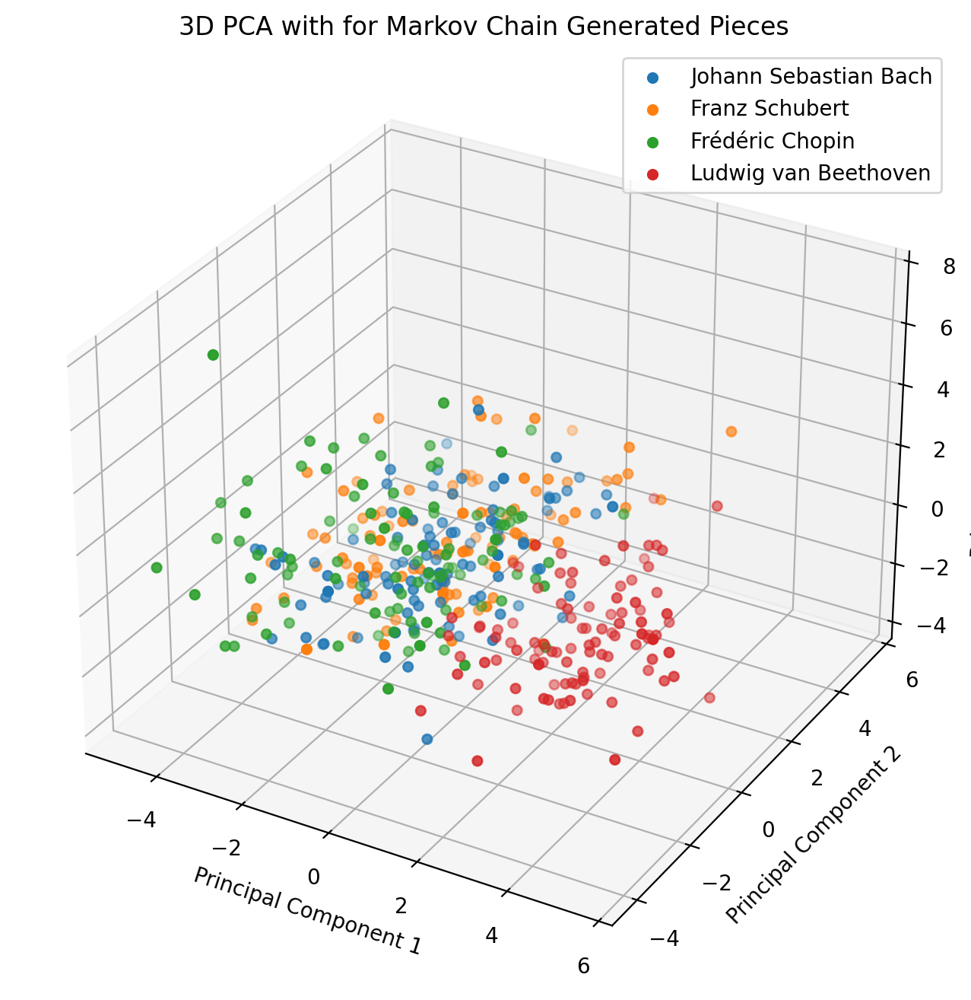

In [ ]:
features = scaled_markov.drop('canonical_composer', axis=1)
labels = scaled_markov['canonical_composer']

pca = PCA(n_components=3)
principal_components = pca.fit_transform(features)
principal_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2', 'PC3'])

final_df = pd.concat([principal_df, scaled_markov['canonical_composer']], axis=1)

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

for label in final_df['canonical_composer'].unique():
    subset = final_df[final_df['canonical_composer'] == label]
    ax.scatter(subset['PC1'], subset['PC2'], subset['PC3'], label=label)

ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
ax.set_title('3D PCA with for Markov Chain Generated Pieces')
ax.legend()

plt.show()

Much more randomness-- three of the 4 classes intermingle and wouldn't be easy to separate. This is likely due to the nature of Markov chains being substantially more random than the LSTM-trained modes.

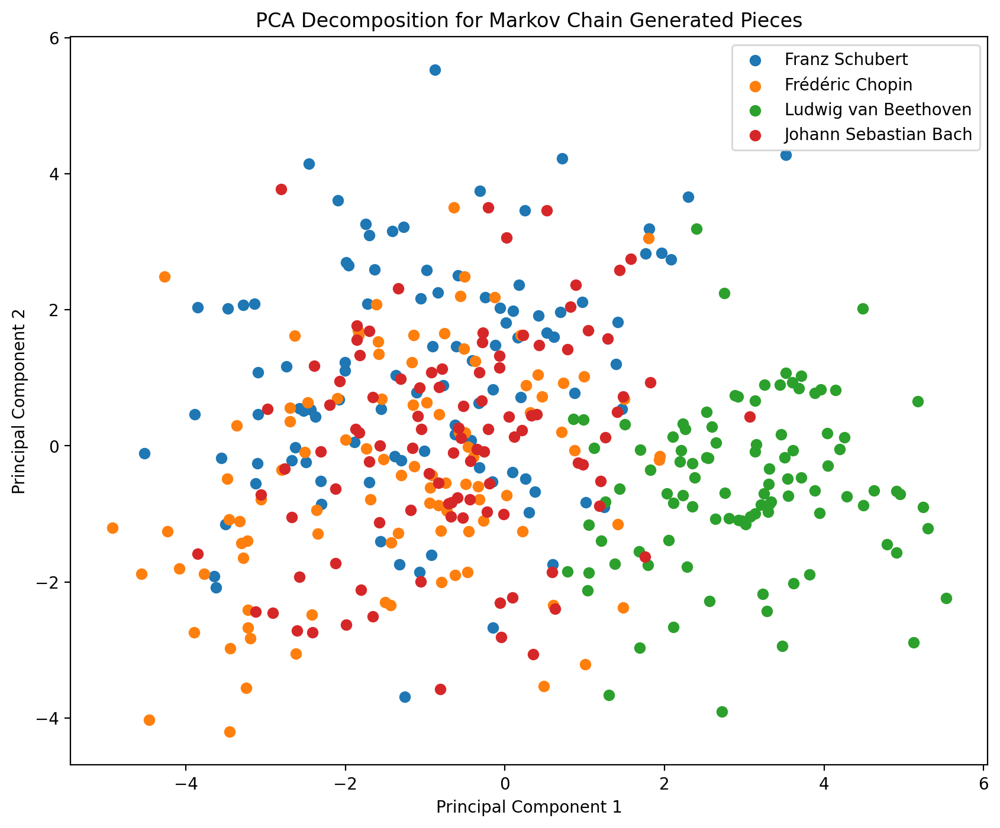

In [ ]:
pca = PCA(n_components=2)  # Specify the number of components to keep
principal_components_2D = pca.fit_transform(features)

# Create a DataFrame with the principal components
pc_df = pd.DataFrame(data=principal_components_2D, columns=['PC1', 'PC2'])

# Concatenate the principal components with the original DataFrame
result_df = pd.concat([labels, pc_df], axis=1)

# Plot the results
plt.figure(figsize=(10,8))

for label in labels.unique():
    label_data = result_df[result_df['canonical_composer'] == label]
    plt.scatter(label_data['PC1'], label_data['PC2'], label=label)

plt.legend()
plt.title('PCA Decomposition for Markov Chain Generated Pieces')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')

# Display the plot
plt.show()

Runnning predicitions...

In [ ]:
predict = h2o.import_file(f'{path}/scaled_markov.csv')

x = predict.columns
y = 'canonical_composer'
x.remove(y)

predictions = leader_model.predict(predict)

predictions_df = predictions['predict'].as_data_frame()

actual_values_df = predict[y].as_data_frame()

result_df = pd.concat([predictions_df, actual_values_df], axis=1)

confusion_matrix = pd.crosstab(result_df['predict'], result_df[y], rownames=['Predicted'], colnames=['Actual'])

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


In [ ]:
print("Confusion Matrix:\n", confusion_matrix)

correct_predictions = confusion_matrix.values.diagonal().sum()
total_predictions = confusion_matrix.values.sum()

accuracy = correct_predictions / total_predictions

print(f"Classification Accuracy: {accuracy * 100:.2f}%")

Confusion Matrix:
 Actual                 Franz Schubert  Frédéric Chopin  Johann Sebastian Bach  \
Predicted                                                                       
Franz Schubert                     27               25                      9   
Frédéric Chopin                    64               65                     31   
Johann Sebastian Bach               0                3                     60   
Ludwig van Beethoven                9                7                      0   

Actual                 Ludwig van Beethoven  
Predicted                                    
Franz Schubert                           29  
Frédéric Chopin                          66  
Johann Sebastian Bach                     3  
Ludwig van Beethoven                      2  
Classification Accuracy: 38.50%


Substantially better results than LSTM-- still not GREAT, but since this uses actual notes in combinations based on observed probabilities. This is almost mathematically  "hacking" the result, but makes for far worse-sounding actual music.